# Find percentiles 
Regions: 

### Wills exacct match (110, 280): 
- lat 30 band
- lat 20 band
- lat 5 band

### Masked Pacific
- lat 30 band
- lat 20 band
- lat 5 band


In [6]:
# import intake
# from xmip.preprocessing import combined_preprocessing
import numpy as np
import xarray as xr
import datatree
# import xesmf as xe
# import intake_esm
import dask

from xarrayutils.plotting import shaded_line_plot

from datatree import DataTree
# from xmip.postprocessing import _parse_metric

import cartopy.crs as ccrs
# import intake_esm
import matplotlib

from xhistogram.xarray import histogram
import xskillscore as xs
%matplotlib inline

import matplotlib.pyplot as plt  # plotting
import matplotlib.pylab as pylab  # package to preset parameters - apparently

from matplotlib import colors
from matplotlib.ticker import PercentFormatter  # percentages for axes
from matplotlib import pyplot  # multiple plots
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
import pandas as pd
import calendar
import math
from scipy.stats import norm
import seaborn as sns
from matplotlib.lines import Line2D



# from sklearn import preprocessing

In [7]:
# dt_cmip_198201-202001_trop_g025
# Gridded data of Nicolas data of tropics lat(-30,30) 1982-2020, datatree with 11 models and multiple ensemble members 

dt_tropics = datatree.open_datatree('/g/data/e14/ic0706/Project_1/timeseries/Gridded_Data/dt_cmip_198201-202001_trop_g025.nc')

In [8]:
models =['CESM1-CAM5',
 'CanESM2',
 'GFDL-ESM2M',
 'MPI-ESM',
 'ACCESS-ESM1-5',
 'CanESM5',
 'EC-Earth3',
 'IPSL-CM6A-LR',
 'MIROC-ES2L',
 'MIROC6',
 'MPI-ESM1-2-LR',
 'CESM2',
 'GFDL-SPEAR-MED']


data_tree=dt_tropics

mods = {}
for model_name, model_data in data_tree.items():
    en=[]
    for ensemble_name, ensemble_data in data_tree[model_name].items():
        en.extend([str(ensemble_name)])
    
    mods[str(model_name)]=en

## Functions used 

#### quantiles_xhist(data)

input: dataset with a variable tos - if different change function

output: dataarray of percentiles with same timeframe and areas of 0.005 scale


#### quantile_datatree(datatree, sources)

input: datatree of the form 


models

  |
  
  --------- ensemble members
  
                 |
                 
                 ------------ datasets with a variable tos 

In [9]:
def quantiles_xhist(data):
    hist_T = data.tos.squeeze()
    weights = np.cos(np.deg2rad(hist_T.lat))
    times = hist_T['time']
    const_area=np.r_[0:1:0.01]
    temps = np.r_[12:34:0.5] # define temperatures for binning 
    
    temps_interp = np.empty([len(times),len(const_area)])
    
    for i in np.r_[0:len(times):1]:  
        h=histogram(hist_T[i],bins=temps,weights=weights).cumsum()
        hh = (h - h[0])/(h[-1]-h[0])
        temps_interp[i]=np.interp(const_area,hh,temps[1:])
    
    
    sst_area= xr.DataArray(temps_interp,coords={'time':times,'area':const_area})

    return(sst_area)



# find percentiles for each model - atm one run per model

## Function only works for datatree with only one run per model!!!!
def quantile_datatree(datatree,sources):
    q ={}
    for i in range(len(sources)):
        q[i] = quantiles_xhist(datatree[sources[i]])

    quantiles = DataTree.from_dict({sources[i]:q[i].rename('temp') for i in range(len(sources))})
    return(quantiles)

Naming conventions (datatrees):

Wills: 

dt_percentile_cmip_wills_198201-202001_latx.nc

pacific: 

dt_percentile_cmip_pacific_198201-202001_latx.nc


# Gridded tropical pacific dataset

In [9]:

sst =dt_tropics['ACCESS-ESM1-5/r39i1p1f1'].tos # temperature grid to choose
LonsPts_pos = [130,120,110,110,110,260,270,270,277,291,291,130] #-np.ones(13)*180
LatsPts_pos =[-20,-10,-5,10,20,20,15,15,10,5,-20,-20]

x_pixel_pos = LonsPts_pos
y_pixel_pos = LatsPts_pos

temp_list = []
for a, b in zip(x_pixel_pos, y_pixel_pos):
    temp_list.append([a, b])

polygon = np.array(temp_list)

xv, yv = sst.lon.values, sst.lat.values
lon2d, lat2d = np.meshgrid(xv, yv)
points = np.hstack((lon2d.reshape((-1,1)), lat2d.reshape((-1,1))))
path = matplotlib.path.Path(polygon)
mask = path.contains_points(points)
mask.shape = lon2d.shape
mask_bit_pos = mask*np.ones_like(lon2d)


mask_mods = mask_bit_pos#+mask_bit_neg

mask_mods[mask_mods==0] = np.nan


dt_pacific = dt_tropics*mask_mods

dt_pacific.to_netcdf('/g/data/e14/ic0706/Project_1/timeseries/Gridded_Data/dt_cmip_198201-202001_trop_pacific_g025.nc')

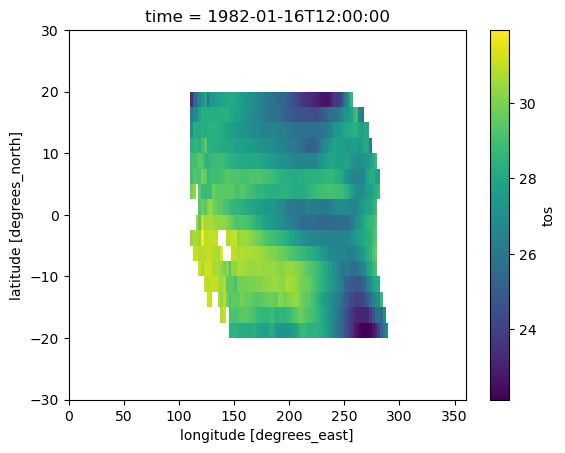

In [11]:
# check
dt_pacific['ACCESS-ESM1-5/r39i1p1f1'].tos.isel(time=0).plot()

## Determine multi model mean sst

In [12]:

# List of desired dimensions
desired_dims = ['time', 'lat', 'lon']

# Function to drop extra dimensions
def drop_extra_dims(array, desired_dims):
    # Select only the desired dimensions
    selected_array = array
    for dim in array.dims:
        if dim not in desired_dims:
            selected_array = selected_array.squeeze(dim=dim)
    return selected_array

mods_avg = {}
avg_all = 0
for model in models:
    avg=0
    for i in range(len(mods[model])):
        to_add = drop_extra_dims(dt_tropics[model][mods[model][i]].tos, desired_dims)
        avg += to_add
    mods_avg[model]  = avg/len(mods[model])
    avg_all +=mods_avg[model].values

mmm = dt_tropics['ACCESS-ESM1-5'][mods['ACCESS-ESM1-5'][0]].tos.copy()
mmm.data= avg_all / len(models)

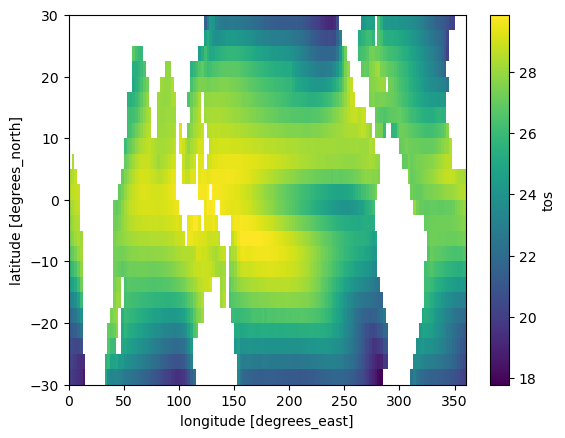

In [14]:
mmm.mean(dim='time').plot()

In [ ]:
# mmm.to_netcdf()

In [16]:
hist_data = mmm.mean(dim='time')
weights = np.cos(np.deg2rad(hist_data.lat))
const_area=np.r_[0:1:0.01]
temps = np.r_[12:34:0.5] # define temperatures for binning 

h=histogram(hist_data,bins=temps,weights=weights).cumsum()
hh = (h - h[0])/(h[-1]-h[0])
temps_interp=np.interp(const_area,hh,temps[1:])

mmm_percentiles = xr.DataArray(temps_interp, coords ={'area':const_area})

In [18]:
mmm_percentiles.to_netcdf('/g/data/e14/ic0706/Project_1/timeseries/percentiles/cmip_mmm_1982_2020_time_avg_percentiles.nc')
hist_data.to_netcdf('/g/data/e14/ic0706/Project_1/timeseries/Gridded_Data/cmip_mmm_1982_2020_time_avg_g025.nc')

### Obs 

In [35]:
obs = xr.open_dataset('~/Project_1/data/sst.mon.ltm.nc')
obs

/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/xarray/coding/times.py:987: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/xarray/core/indexing.py:525: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(self.get_duck_array(), dtype=dtype)


<xarray.Dataset> Size: 2MB
Dimensions:             (lat: 89, lon: 180, time: 12, nbnds: 2)
Coordinates:
  * lat                 (lat) float32 356B 88.0 86.0 84.0 ... -84.0 -86.0 -88.0
  * lon                 (lon) float32 720B 0.0 2.0 4.0 6.0 ... 354.0 356.0 358.0
  * time                (time) object 96B 0001-01-01 00:00:00 ... 0001-12-01 ...
Dimensions without coordinates: nbnds
Data variables:
    climatology_bounds  (time, nbnds) datetime64[ns] 192B ...
    sst                 (time, lat, lon) float32 769kB ...
    valid_yr_count      (time, lat, lon) float32 769kB ...
Attributes: (12/38)
    climatology:                    Climatology is based on 1971-2000 SST, Xu...
    description:                    In situ data: ICOADS2.5 before 2007 and N...
    keywords_vocabulary:            NASA Global Change Master Directory (GCMD...
    keywords:                       Earth Science > Oceans > Ocean Temperatur...
    instrument:                     Conventional thermometers
    source_comment:                 SSTs were observed by conventional thermo...
    ...                             ...
    license:                        No constraints on data access or use
    comment:                        SSTs were observed by conventional thermo...
    summary:                        ERSST.v5 is developed based on v4 after r...
    dataset_title:                  NOAA Extended Reconstructed SST V5
    data_modified:                  2021-02-07
    not_missing_threshold_percent:  minimum 3% values input to have non-missi...

In [14]:
kaplan_sst = xr.open_dataarray('~/Project_1/data/kaplan_sst_1856-2022_2deg.nc').sel(time= slice('1982','2020'))

In [33]:
kaplan_sst_percentiles = quantiles_xhist(kaplan_sst,np.r_[-5:5:0.5])

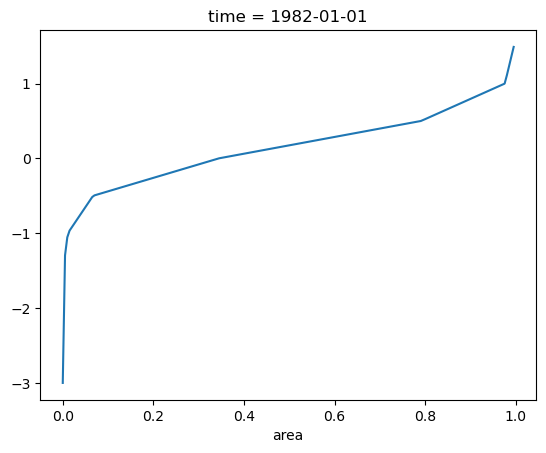

In [34]:
kaplan_sst_percentiles.isel(time=0).plot()

In [10]:

## Exact Wills 

# dt = dt_tropics.sel(lon=slice(110,280))

# print('starting...')
# cmip_percentiles_lat30 = DataTree(name='Models')
# data = dt_tropics.sel(lon=slice(110,280)).sel(lat=slice(-5,5))
# ds={}
# for m in range(len(models)):
#     print(models[m])
#     ds[m] = quantile_datatree(data[models[m]],mods[models[m]][0:len(mods[models[m]])])

# cmip_percentiles_lat30.children = {models[i]:ds[i] for i in range(len(models))}
# del ds
# del data

# print('percentiles ma lat=(-30,30) done')
# cmip_percentiles_lat30.to_netcdf('/g/data/e14/ic0706/Project_1/timeseries/percentiles/dt_percentile_cmip_wills_198201-202001_lat5.nc')
# print('saved')



cmip_percentiles_lat20 = DataTree(name='Models')
data = dt_tropics.sel(lat=slice(-20,20)).sel(lon=slice(110,280))
ds={}
for m in range(len(models)):
    print(models[m])
    ds[m] = quantile_datatree(data[models[m]],mods[models[m]][0:len(mods[models[m]])])

cmip_percentiles_lat20.children = {models[i]:ds[i] for i in range(len(models))}
del ds
del data

print('percentiles ma lat=(-20,20) done')
cmip_percentiles_lat20.to_netcdf('/g/data/e14/ic0706/Project_1/timeseries/percentiles/dt_percentile_cmip_wills_198201-202001_lat20.nc')
print('saved')


# cmip_percentiles_lat5 = DataTree(name='Models')
# data = dt_tropics.sel(lat=slice(-30,30)).sel(lon=slice(110,280))
# ds={}
# for m in range(len(models)):
#     print(models[m])
#     ds[m] = quantile_datatree(data[models[m]],mods[models[m]][0:len(mods[models[m]])])

# cmip_percentiles_lat5.children = {models[i]:ds[i] for i in range(len(models))}
# del ds
# del data

# print('percentiles ma lat=(-30,30) done')
# cmip_percentiles_lat5.to_netcdf('/g/data/e14/ic0706/Project_1/timeseries/percentiles/dt_percentile_cmip_wills_198201-202001_lat30.nc')
# print('saved')

CESM1-CAM5


KeyboardInterrupt: 

## Find percentiles of tropical Pacific

#### Mask

In [14]:

## pacific  


# print('starting...')
# cmip_percentiles_lat30 = DataTree(name='Models')
# data = dt_pacific.sel(lat=slice(-5,5))
# ds={}
# for m in range(len(models)):
#     print(models[m])
#     ds[m] = quantile_datatree(data[models[m]],mods[models[m]][0:len(mods[models[m]])])

# cmip_percentiles_lat30.children = {models[i]:ds[i] for i in range(len(models))}
# del ds
# del data

# print('percentiles ma lat=(-30,30) done')
# cmip_percentiles_lat30.to_netcdf('/g/data/e14/ic0706/Project_1/timeseries/percentiles/dt_percentile_cmip_pacific_198201-202001_lat5.nc')
# print('saved')



cmip_percentiles_lat20 = DataTree(name='Models')
data =dt_pacific.sel(lat=slice(-20,20))
ds={}
for m in range(len(models)):
    print(models[m])
    ds[m] = quantile_datatree(data[models[m]],mods[models[m]][0:len(mods[models[m]])])

cmip_percentiles_lat20.children = {models[i]:ds[i] for i in range(len(models))}
del ds
del data

print('percentiles ma lat=(-20,20) done')
cmip_percentiles_lat20.to_netcdf('/g/data/e14/ic0706/Project_1/timeseries/percentiles/dt_percentile_cmip_pacific_198201-202001_lat20.nc')
print('saved')


# cmip_percentiles_lat5 = DataTree(name='Models')
# data = dt_pacific.sel(lat=slice(-30,30))
# ds={}
# for m in range(len(models)):
#     print(models[m])
#     ds[m] = quantile_datatree(data[models[m]],mods[models[m]][0:len(mods[models[m]])])

# cmip_percentiles_lat5.children = {models[i]:ds[i] for i in range(len(models))}
# del ds
# del data

# print('percentiles ma lat=(-30,30) done')
# cmip_percentiles_lat5.to_netcdf('/g/data/e14/ic0706/Project_1/timeseries/percentiles/dt_percentile_cmip_pacific_198201-202001_lat30.nc')
# print('saved')

CESM1-CAM5
CanESM2
GFDL-ESM2M
MPI-ESM
ACCESS-ESM1-5
IPSL-CM6A-LR
MIROC-ES2L
MIROC6
MPI-ESM1-2-LR
CESM2
GFDL-SPEAR-MED
percentiles ma lat=(-20,20) done
saved


In [15]:
cmip_percentiles_lat20

DataTree('Models', parent=None)
├── DataTree('CESM1-CAM5')
│   ├── DataTree('r14i1p1')
│   │       Dimensions:  (time: 468, area: 100)
│   │       Coordinates:
│   │         * time     (time) object 4kB 1982-01-01 00:00:00 ... 2020-12-01 00:00:00
│   │         * area     (area) float64 800B 0.0 0.01 0.02 0.03 0.04 ... 0.96 0.97 0.98 0.99
│   │       Data variables:
│   │           temp     (time, area) float64 374kB 21.0 22.25 22.78 ... 30.3 30.39 30.49
│   ├── DataTree('r30i1p1')
│   │       Dimensions:  (time: 468, area: 100)
│   │       Coordinates:
│   │         * time     (time) object 4kB 1982-01-01 00:00:00 ... 2020-12-01 00:00:00
│   │         * area     (area) float64 800B 0.0 0.01 0.02 0.03 0.04 ... 0.96 0.97 0.98 0.99
│   │       Data variables:
│   │           temp     (time, area) float64 374kB 20.5 21.58 22.06 ... 30.09 30.23 30.36
│   ├── DataTree('r28i1p1')
│   │       Dimensions:  (time: 468, area: 100)
│   │       Coordinates:
│   │         * time     (time) object 4kB 1982-01-01 00:00:00 ... 2020-12-01 00:00:00
│   │         * area     (area) float64 800B 0.0 0.01 0.02 0.03 0.04 ... 0.96 0.97 0.98 0.99
│   │       Data variables:
│   │           temp     (time, area) float64 374kB 20.0 21.56 22.02 ... 30.15 30.32 30.5
│   ├── DataTree('r40i1p1')
│   │       Dimensions:  (time: 468, area: 100)
│   │       Coordinates:
│   │         * time     (time) object 4kB 1982-01-01 00:00:00 ... 2020-12-01 00:00:00
│   │         * area     (area) float64 800B 0.0 0.01 0.02 0.03 0.04 ... 0.96 0.97 0.98 0.99
│   │       Data variables:
│   │           temp     (time, area) float64 374kB 20.5 21.72 22.33 ... 30.31 30.4 30.49
│   ├── DataTree('r2i1p1')
│   │       Dimensions:  (time: 468, area: 100)
│   │       Coordinates:
│   │         * time     (time) object 4kB 1982-01-01 00:00:00 ... 2020-12-01 00:00:00
│   │         * area     (area) float64 800B 0.0 0.01 0.02 0.03 0.04 ... 0.96 0.97 0.98 0.99
│   │       Data variables:
│   │           temp     (time, area) float64 374kB 19.5 21.57 21.89 ... 30.4 30.5 30.75
│   ├── DataTree('r7i1p1')
│   │       Dimensions:  (time: 468, area: 100)
│   │       Coordinates:
│   │         * time     (time) object 4kB 1982-01-01 00:00:00 ... 2020-12-01 00:00:00
│   │         * area     (area) float64 800B 0.0 0.01 0.02 0.03 0.04 ... 0.96 0.97 0.98 0.99
│   │       Data variables:
│   │           temp     (time, area) float64 374kB 21.5 22.06 22.46 ... 30.26 30.35 30.43
│   ├── DataTree('r5i1p1')
│   │       Dimensions:  (time: 468, area: 100)
│   │       Coordinates:
│   │         * time     (time) object 4kB 1982-01-01 00:00:00 ... 2020-12-01 00:00:00
│   │         * area     (area) float64 800B 0.0 0.01 0.02 0.03 0.04 ... 0.96 0.97 0.98 0.99
│   │       Data variables:
│   │           temp     (time, area) float64 374kB 20.5 21.58 22.07 ... 30.34 30.4 30.47
│   ├── DataTree('r38i1p1')
│   │       Dimensions:  (time: 468, area: 100)
│   │       Coordinates:
│   │         * time     (time) object 4kB 1982-01-01 00:00:00 ... 2020-12-01 00:00:00
│   │         * area     (area) float64 800B 0.0 0.01 0.02 0.03 0.04 ... 0.96 0.97 0.98 0.99
│   │       Data variables:
│   │           temp     (time, area) float64 374kB 22.0 22.88 23.25 ... 30.46 30.56 30.92
│   ├── DataTree('r1i1p1')
│   │       Dimensions:  (time: 468, area: 100)
│   │       Coordinates:
│   │         * time     (time) object 4kB 1982-01-01 00:00:00 ... 2020-12-01 00:00:00
│   │         * area     (area) float64 800B 0.0 0.01 0.02 0.03 0.04 ... 0.96 0.97 0.98 0.99
│   │       Data variables:
│   │           temp     (time, area) float64 374kB 21.0 22.2 22.75 ... 30.35 30.44 30.63
│   ├── DataTree('r8i1p1')
│   │       Dimensions:  (time: 468, area: 100)
│   │       Coordinates:
│   │         * time     (time) object 4kB 1982-01-01 00:00:00 ... 2020-12-01 00:00:00
│   │         * area     (area) float64 800B 0.0 0.01 0.02 0.03 0.04 ... 0.96 0.97 0.98 0.99
│   │       Data variables:
│   │           temp     (time, area) float6

# find average 50% for each model mean and average sst map for each model 

In [2]:
cmip_percentiles_lat20= datatree.open_datatree('/g/data/e14/ic0706/Project_1/timeseries/percentiles/dt_percentile_cmip_pacific_198201-202001_lat20.nc')


0.3.0


In [9]:
model_mean={}
for m in range(len(models)):
    x=0
    sources = mods[models[m]][0:len(mods[models[m]])]
    for i in range(len(sources)):
        x = x+ cmip_percentiles_lat20[models[m]+'/'+sources[i]]
    model_mean[m]=x/len(sources)
    
    del x

In [36]:
area=[]
for i in range(len(models)):
    area.append(model_mean[i].sel(area=0.5).mean().temp.values)

In [39]:
area

[array(28.29208444),
 array(28.30126976),
 array(27.50995796),
 array(27.4175911),
 array(27.31300602),
 array(27.25948528),
 array(27.45265281),
 array(26.83416531),
 array(28.2127101),
 array(27.85479462),
 array(27.42030803)]

In [40]:
dt_tropics['ACCESS-ESM1-5/r39i1p1f1'].lat.values

DataTree('None', parent=None)
├── DataTree('ACCESS-ESM1-5')
│   ├── DataTree('r39i1p1f1')
│   │       Dimensions:  (time: 468, lon: 144, lat: 24)
│   │       Coordinates:
│   │         * time     (time) datetime64[ns] 1982-01-16T12:00:00 ... 2020-12-16T12:00:00
│   │         * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
│   │         * lat      (lat) float64 -28.75 -26.25 -23.75 -21.25 ... 23.75 26.25 28.75
│   │       Data variables:
│   │           tos      (time, lat, lon) float64 ...
│   ├── DataTree('r36i1p1f1')
│   │       Dimensions:  (time: 468, lon: 144, lat: 24)
│   │       Coordinates:
│   │         * time     (time) datetime64[ns] 1982-01-16T12:00:00 ... 2020-12-16T12:00:00
│   │         * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
│   │         * lat      (lat) float64 -28.75 -26.25 -23.75 -21.25 ... 23.75 26.25 28.75
│   │       Data variables:
│   │           tos      (time, lat, lon) float64 ...
│   ├── DataTree('r12i1p1f1')
│   │       Dimensions:  (time: 468, lon: 144, lat: 24)
│   │       Coordinates:
│   │         * time     (time) datetime64[ns] 1982-01-16T12:00:00 ... 2020-12-16T12:00:00
│   │         * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
│   │         * lat      (lat) float64 -28.75 -26.25 -23.75 -21.25 ... 23.75 26.25 28.75
│   │       Data variables:
│   │           tos      (time, lat, lon) float64 ...
│   ├── DataTree('r6i1p1f1')
│   │       Dimensions:  (time: 468, lon: 144, lat: 24)
│   │       Coordinates:
│   │         * time     (time) datetime64[ns] 1982-01-16T12:00:00 ... 2020-12-16T12:00:00
│   │         * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
│   │         * lat      (lat) float64 -28.75 -26.25 -23.75 -21.25 ... 23.75 26.25 28.75
│   │       Data variables:
│   │           tos      (time, lat, lon) float64 ...
│   ├── DataTree('r28i1p1f1')
│   │       Dimensions:  (time: 468, lon: 144, lat: 24)
│   │       Coordinates:
│   │         * time     (time) datetime64[ns] 1982-01-16T12:00:00 ... 2020-12-16T12:00:00
│   │         * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
│   │         * lat      (lat) float64 -28.75 -26.25 -23.75 -21.25 ... 23.75 26.25 28.75
│   │       Data variables:
│   │           tos      (time, lat, lon) float64 ...
│   ├── DataTree('r35i1p1f1')
│   │       Dimensions:  (time: 468, lon: 144, lat: 24)
│   │       Coordinates:
│   │         * time     (time) datetime64[ns] 1982-01-16T12:00:00 ... 2020-12-16T12:00:00
│   │         * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
│   │         * lat      (lat) float64 -28.75 -26.25 -23.75 -21.25 ... 23.75 26.25 28.75
│   │       Data variables:
│   │           tos      (time, lat, lon) float64 ...
│   ├── DataTree('r14i1p1f1')
│   │       Dimensions:  (time: 468, lon: 144, lat: 24)
│   │       Coordinates:
│   │         * time     (time) datetime64[ns] 1982-01-16T12:00:00 ... 2020-12-16T12:00:00
│   │         * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
│   │         * lat      (lat) float64 -28.75 -26.25 -23.75 -21.25 ... 23.75 26.25 28.75
│   │       Data variables:
│   │           tos      (time, lat, lon) float64 ...
│   ├── DataTree('r32i1p1f1')
│   │       Dimensions:  (time: 468, lon: 144, lat: 24)
│   │       Coordinates:
│   │         * time     (time) datetime64[ns] 1982-01-16T12:00:00 ... 2020-12-16T12:00:00
│   │         * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
│   │         * lat      (lat) float64 -28.75 -26.25 -23.75 -21.25 ... 23.75 26.25 28.75
│   │       Data variables:
│   │           tos      (time, lat, lon) float64 ...
│   ├── DataTree('r37i1p1f1')
│   │       Dimensions:  (time: 468, lon: 144, lat: 24)
│   │       Coordinates:
│   │         * time     (time) datetime64[ns] 1982-01-16T12:00:00 ... 2020-12-16T12:00:00
│   │      

In [61]:
lats = dt_tropics['ACCESS-ESM1-5/r39i1p1f1'].lat.values
lons = dt_tropics['ACCESS-ESM1-5/r39i1p1f1'].lon.values
model_mean=np.empty((len(models),len(lats),len(lons)))
# model_mean={}
for m in range(len(models)):
    x=0
    sources = mods[models[m]][0:len(mods[models[m]])]
    for i in range(len(sources)):
        x = x+ dt_tropics[models[m]+'/'+sources[i]]
    model_mean[m,:,:] = (x/len(sources)).tos.mean(dim='time').values
    
    del x

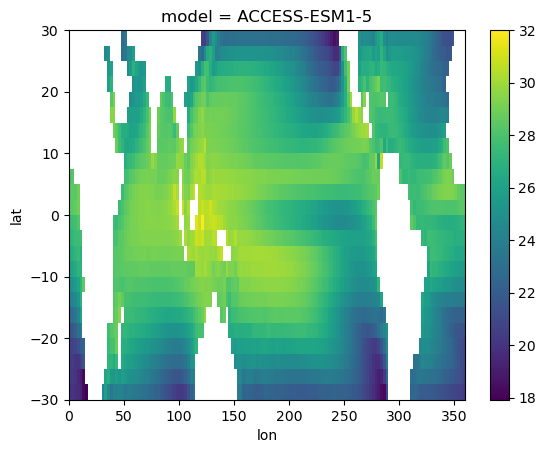

In [64]:
# avg = xr.DataArray(model_mean, coords = {'model':models,'lat':lats,'lon':lons})
avg.isel(model=0).plot()

In [63]:
avg.to_netcdf('/g/data/e14/ic0706/Project_1/timeseries/Gridded_Data/da_cmip_avg_sst_pacific_lat20.nc')
